<a id="title_ID"></a>
# JWST Pipeline Validation Notebook: calwebb_image2, background subtraction for MIRI imaging

<span style="color:red"> **Instruments Affected**</span>: e.g., FGS, MIRI, NIRCam, NIRISS 

### Table of Contents


<div style="text-align: left"> 
    
<br> [Introduction\*](#intro)
<br> [JWST CalWG Algorithm\*](#algorithm)
<br> [Defining Terms](#terms)
<br> [Test Description\*](#description)
<br> [Data Description\*](#data_descr)
<br> [Imports\*](#imports)
<br> [Loading the Data\*](#data_load)
<br> [Run the Pipeline](#pipeline)
<br> [Passing criteria](#testing) 
<br> [About This Notebook\*](#about)
<br>    

</div>

<a id="intro"></a>
# Introduction


This is the validation notebook for the background subtraction step as part of calwebb_image2. This step takes in a set of images and a set of background observations. If more than one background observation is given, they are combined into a sigma clipped mean before being subtracted from each of the science data images. For more information on the pipeline step visit the links below. 

Step description: https://jwst-pipeline.readthedocs.io/en/latest/jwst/background_step/description.html

Pipeline code: https://github.com/spacetelescope/jwst/tree/master/jwst/background

[Top of Page](#title_ID)

<a id="algorithm"></a>
# JWST CalWG Algorithm

The page describing the algorithm and any details can be found here:

https://outerspace.stsci.edu/display/JWSTCC/Vanilla+Imaging+Background+Subtraction


[Top of Page](#title_ID)

<a id="terms"></a>
# Defining Terms

Here are some common terms that will be used throughout the notebook

> JWST: James Webb Space Telescope

> MIRI: Mid-Infrared Instrument

> MIRISim: Simulator that creates pipeline ready MIRI simulated data


[Top of Page](#title_ID)

<a id="description"></a>
# Test Description

This test is performed by creating a set of simulated data with multiple point sources located at random locations across the MIRI field of view. There is a set of 4 simulated images at four dithered positions with 300+ stars and a galaxy in the MIRI field of view (including Lyot). This test also takes in a set of four simulated background images, at four dithered positions, with around 40 fainter stars across the field of view and Lyot mask. All images will be processed through calwebb_detector1, and put into an association file to be run through calwebb_image2. This will tell the background step which are the science observations and which are the background observations so that it will do a sigma clipped mean of the background exposures, then subtract the mean from each of the science observations.

The notebook shows the images (background, science, averaged background, and background subtracted) through the course of the notebook to demonstrate how well the algorithm works.


[Top of Page](#title_ID)

<a id="data_descr"></a>
# Data Description


The set of data used in this particular test were created with the MIRI Data Simulator (MIRISim). There is a set of 4 simulated images at four dithered positions with 300+ stars and a galaxy in the MIRI field of view (including Lyot). This test also takes in a set of four simulated background images, at four dithered positions, with around 40 fainter stars across the field of view and Lyot mask. All of the images were created with the F770W filter.


[Top of Page](#title_ID)

<a id="tempdir"></a>
# Set up Temporary Directory
The following cell sets up a temporary directory (using python's `tempfile.TemporaryDirectory()`), and changes the script's active directory into that directory (using python's `os.chdir()`). This is so that, when the notebook is run through, it will download files to (and create output files in) the temporary directory rather than in the notebook's directory. This makes cleanup significantly easier (since all output files are deleted when the notebook is shut down), and also means that different notebooks in the same directory won't interfere with each other when run by the automated webpage generation process.

If you want the notebook to generate output in the notebook's directory, simply don't run this cell.

If you have a file (or files) that are kept in the notebook's directory, and that the notebook needs to use while running, you can copy that file into the directory (the code to do so is present below, but commented out).

[Top of Page](#title_ID)

In [1]:
#****
#
# Set this variable to False to not use the temporary directory
#
#****
use_tempdir = True

# Create a temporary directory to hold notebook output, and change the working directory to that directory.
from tempfile import TemporaryDirectory
import os
import shutil

if use_tempdir:
    data_dir = TemporaryDirectory()

    # Save original directory
    orig_dir = os.getcwd()

    # Move to new directory
    os.chdir(data_dir.name)

# For info, print out where the script is running
print("Running in {}".format(os.getcwd()))

Running in /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p


## If Desired, set up CRDS to use a local cache

By default, the notebook template environment sets up its CRDS cache (the "CRDS_PATH" environment variable) in /grp/crds/cache. However, if the notebook is running on a local machine without a fast and reliable connection to central storage, it makes more sense to put the CRDS cache locally. Currently, the cell below offers several options, and will check the supplied boolean variables one at a time until one matches.

* if `use_local_crds_cache` is False, then the CRDS cache will be kept in /grp/crds/cache
* if `use_local_crds_cache` is True, the CRDS cache will be kept locally
  * if `crds_cache_tempdir` is True, the CRDS cache will be kept in the temporary directory
  * if `crds_cache_notebook_dir` is True, the CRDS cache will be kept in the same directory as the notebook.
  * if `crds_cache_home` is True, the CRDS cache will be kept in $HOME/crds/cache
  * if `crds_cache_custom_dir` is True, the CRDS cache will be kept in whatever is stored in the 
    `crds_cache_dir_name` variable.

If the above cell (creating a temporary directory) is not run, then setting `crds_cache_tempdir` to True will store the CRDS cache in the notebook's directory (the same as setting `crds_cache_notebook_dir` to True).

In [2]:
import os
if 'CRDS_CACHE_TYPE' in os.environ:
    if os.environ['CRDS_CACHE_TYPE'] == 'local':
        os.environ['CRDS_PATH'] = os.path.join(os.environ['HOME'], 'crds', 'cache')
    elif os.path.isdir(os.environ['CRDS_CACHE_TYPE']):
        os.environ['CRDS_PATH'] = os.environ['CRDS_CACHE_TYPE']
print('CRDS cache location: {}'.format(os.environ['CRDS_PATH']))

CRDS cache location: /grp/crds/cache


<a id="imports"></a>
# Imports
List the package imports and why they are relevant to this notebook.


* astropy.io for opening fits files
* inspect to get the docstring of our objects.
* IPython.display for printing markdown output
* jwst.datamodels for building model for JWST Pipeline
* jwst.module.PipelineStep is the pipeline step being tested
* matplotlib.pyplot.plt to generate plot


[Top of Page](#title_ID)

In [3]:
# import inspect
from astropy.io import fits
# from IPython.display import Markdown
from ci_watson.artifactory_helpers import get_bigdata
import glob

from jwst.datamodels import RampModel, ImageModel
from jwst.pipeline import Detector1Pipeline, Image2Pipeline
from jwst import associations
from jwst.associations.lib.rules_level2_base import DMSLevel2bBase
from jwst.associations import asn_from_list
from jwst.background import BackgroundStep

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

<a id="data_load"></a>
# Loading the Data

Download data from  Box to use in the notebook.

[Top of Page](#title_ID)

In [4]:
from astropy.utils.data import download_file
from pathlib import Path
from shutil import move
from os.path import splitext

def get_box_files(file_list):
    for box_url,file_name in file_list:
        if 'https' not in box_url:
            box_url = 'https://stsci.box.com/shared/static/' + box_url
        downloaded_file = download_file(box_url)
        if Path(file_name).suffix == '':
            ext = splitext(box_url)[1]
            file_name += ext
        move(downloaded_file, file_name)


file_urls = ['https://stsci.box.com/shared/static/4i7z7q24rotc52m6bcr5ymekt2whuwto.fits', 
             'https://stsci.box.com/shared/static/0fsqi7diuejt4uosjsnqv2q9qx4g7zk4.fits',
             'https://stsci.box.com/shared/static/kd1liugoruiz40v5u5bu19u68zn51iec.fits',
             'https://stsci.box.com/shared/static/o0v5skb6ohnj8qdhk64b07kvgldn37e3.fits',
             'https://stsci.box.com/shared/static/i30rmp4vz337j0qslbqn0sddraarpnl8.fits',
             'https://stsci.box.com/shared/static/o6gsumrc7w2orqu4dlo3limi37pduxtg.fits',
             'https://stsci.box.com/shared/static/075munkxxlk2g1009irs6zanjco2e2cq.fits',
             'https://stsci.box.com/shared/static/ppdyqjud4g5u1eaksztyx5b8rl1bzzzp.fits']
             

files = ['starfield_med_seq1_MIRIMAGE_F770Wexp1.fits', 
         'starfield_med_seq2_MIRIMAGE_F770Wexp1.fits', 
         'starfield_med_seq3_MIRIMAGE_F770Wexp1.fits',
         'starfield_med_seq4_MIRIMAGE_F770Wexp1.fits',
         'bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits',
         'bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits',
         'bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits',
         'bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits']
         

box_download_list = [(url,name) for url,name in zip(file_urls,files)]


get_box_files(box_download_list)


#This readnoise file is needed for use with simulated data which has higher readnoise than actual data.
readnoise = get_bigdata('jwst_validation_notebooks',
                     'validation_data',
                     'jump',                     
                     'jump_miri_test', 
                     'jwst_mirisim_readnoise.fits')

print(files)

['starfield_med_seq1_MIRIMAGE_F770Wexp1.fits', 'starfield_med_seq2_MIRIMAGE_F770Wexp1.fits', 'starfield_med_seq3_MIRIMAGE_F770Wexp1.fits', 'starfield_med_seq4_MIRIMAGE_F770Wexp1.fits', 'bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits', 'bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits', 'bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits', 'bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits']


<a id="pipeline"></a>
# Run calwebb_detector1


[Top of Page](#title_ID)

In [5]:
# Run the calwebb_detector1 pipeline

# set up pipeline parameters 
rej_thresh=10.0  # rejection threshold for jump step

print('There are ', len(files), ' images.')

scislopelist = []    
bkgslopelist = []
    
# loop over list of files
for file in files:
    
    # set up pipeline parameters for input
    pipe1 = Detector1Pipeline()
    pipe1.jump.rejection_threshold = rej_thresh
    pipe1.jump.override_readnoise = readnoise
    pipe1.ramp_fit.override_readnoise = readnoise
       
    pipe1.refpix.skip = True  # needs update to simulator for this to work properly with simulated data
    
    # set up output file name
    base, remainder = file.split('.')
    outname = base
        
    #pipe1.jump.output_file = outname+'.fits'    
    #pipe1.ramp_fit.output_file = outname+'.fits'
    pipe1.output_file = outname+'.fits'

    # Run pipeline on each file
    rampfile = pipe1.run(file)
    if 'starfield' in file:
        scislopelist.append(rampfile)
    else:
        bkgslopelist.append(rampfile)
    

print('Detector 1 steps completed on all files.')
print('Science files: ', scislopelist)
print('Background files: ', bkgslopelist)

2022-03-23 12:28:04,141 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:28:04,143 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:28:04,144 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:28:04,145 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:28:04,146 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:28:04,147 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:28:04,149 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:28:04,150 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:28:04,151 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:28:04,151 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:28:04,153 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:28:04,154 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:28:04,155 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:28:04,156 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:28:04,157 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:28:04,158 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:28:04,159 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:28:04,346 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('starfield_med_seq1_MIRIMAGE_F770Wexp1.fits',).


There are  8  images.


2022-03-23 12:28:04,357 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/starfield_med_seq1_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': Fals

2022-03-23 12:28:05,448 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'starfield_med_seq1_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:28:05,881 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:28:05,884 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:28:05,886 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:28:05,889 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:28:05,892 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:28:05,893 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:28:05,894 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:28:05,894 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:28:05,896 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:28:05,898 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:28:05,899 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:28:05,899 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:28:05,900 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:28:05,900 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:28:06,348 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:06,350 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:06,641 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:28:06,642 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:28:06,645 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:28:06,825 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:06,827 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:06,850 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:28:07,380 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:28:07,536 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:07,538 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:07,559 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:28:08,441 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 saturated pixels


2022-03-23 12:28:08,486 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:28:08,495 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:28:08,653 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:08,654 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:08,675 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:28:10,269 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:28:10,452 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:10,454 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:10,737 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:28:10,903 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:10,905 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:11,189 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:28:11,353 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:11,355 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:11,377 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:28:12,433 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:28:12,598 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:12,599 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:28:12,623 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:28:13,706 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:28:13,868 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:13,870 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:28:13,891 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:28:14,215 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:28:14,375 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:14,377 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:28:14,398 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:28:22,132 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:28:22,133 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:28:23,241 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:28:23,416 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:23,418 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:28:23,419 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:28:23,421 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:28:23,573 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:23,575 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:28:23,585 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:28:23,597 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:28:23,622 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:28:24,080 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:28:24,203 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:28:26,063 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2192 pixels with at least one CR from five groups.


2022-03-23 12:28:26,064 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:28:26,064 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:28:26,467 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:28:28,362 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1791 pixels with at least one CR from five groups.


2022-03-23 12:28:28,363 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:28:28,363 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:28:28,701 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:28:30,595 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1670 pixels with at least one CR from five groups.


2022-03-23 12:28:30,597 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:28:30,597 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:28:30,924 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.84323 sec


2022-03-23 12:28:30,930 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.345098


2022-03-23 12:28:30,936 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:28:31,119 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:28:31,120 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:28:31,142 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:28:31,143 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:28:31,194 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:28:31,195 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:28:31,212 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:28:31,213 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:29:14,103 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:29:14,105 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:29:14,211 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:29:14,399 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:14,401 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:14,446 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:29:14,447 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:29:14,451 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:29:14,595 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:14,596 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:14,640 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:29:14,641 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:29:14,646 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:29:14,771 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq1_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:29:14,773 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:29:14,845 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq1_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:29:14,846 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:29:14,854 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:29:14,856 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:29:14,857 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:29:14,858 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:29:14,860 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:29:14,861 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:29:14,862 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:29:14,863 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:29:14,864 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:29:14,865 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:29:14,866 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:29:14,867 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:29:14,868 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:29:14,869 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:29:14,870 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:29:14,871 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:29:14,872 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:29:15,022 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('starfield_med_seq2_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:29:15,031 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/starfield_med_seq2_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': Fals

2022-03-23 12:29:15,290 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'starfield_med_seq2_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:29:15,298 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:29:15,300 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:29:15,300 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:29:15,302 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:29:15,303 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:29:15,305 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:29:15,305 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:29:15,305 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:29:15,307 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:29:15,309 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:29:15,311 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:29:15,311 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:29:15,311 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:29:15,312 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:29:15,721 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:15,722 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:15,996 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:29:15,997 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:29:15,999 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:29:16,144 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:16,145 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:16,166 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:29:16,598 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:29:16,748 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:16,749 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:16,770 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:29:17,583 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 saturated pixels


2022-03-23 12:29:17,635 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:29:17,644 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:29:17,795 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:17,797 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:17,817 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:29:19,439 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:29:19,618 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:19,620 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:19,931 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:29:20,120 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:20,121 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:20,439 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:29:20,642 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:20,643 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:20,667 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:29:21,220 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:29:21,412 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:21,414 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:29:21,434 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:29:22,587 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:29:22,778 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:22,780 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:29:22,801 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:29:23,113 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:29:23,306 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:23,308 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:29:23,328 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:29:24,678 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:29:24,679 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:29:25,808 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:29:26,020 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:26,021 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:29:26,022 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:29:26,024 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:29:26,199 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:26,201 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:29:26,211 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:29:26,224 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:29:26,248 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:29:26,701 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:29:26,826 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:29:28,856 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2064 pixels with at least one CR from five groups.


2022-03-23 12:29:28,856 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:29:28,857 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:29:29,250 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:29:31,514 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1844 pixels with at least one CR from five groups.


2022-03-23 12:29:31,517 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:29:31,518 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:29:31,868 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:29:33,818 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1871 pixels with at least one CR from five groups.


2022-03-23 12:29:33,819 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:29:33,820 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:29:34,172 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 7.46992 sec


2022-03-23 12:29:34,179 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.967614


2022-03-23 12:29:34,185 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:29:34,435 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:29:34,437 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:29:34,459 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:29:34,459 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:29:34,511 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:29:34,512 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:29:34,532 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:29:34,533 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:30:18,067 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:30:18,069 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:30:18,178 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:30:18,345 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:18,347 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:18,390 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:30:18,391 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:30:18,395 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:30:18,490 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:18,491 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:18,532 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:30:18,533 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:30:18,537 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:30:18,655 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq2_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:30:18,657 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:30:18,722 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq2_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:30:18,723 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:30:18,730 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:30:18,732 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:30:18,733 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:30:18,734 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:30:18,735 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:30:18,736 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:30:18,737 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:30:18,738 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:30:18,739 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:30:18,741 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:30:18,742 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:30:18,743 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:30:18,744 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:30:18,745 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:30:18,746 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:30:18,748 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:30:18,749 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:30:18,849 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('starfield_med_seq3_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:30:18,858 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/starfield_med_seq3_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': Fals

2022-03-23 12:30:19,103 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'starfield_med_seq3_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:30:19,110 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:30:19,112 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:30:19,114 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:30:19,115 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:30:19,117 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:30:19,118 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:30:19,118 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:30:19,119 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:30:19,121 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:30:19,122 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:30:19,124 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:30:19,124 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:30:19,125 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:30:19,125 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:30:19,454 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:19,456 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:19,715 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:30:19,716 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:30:19,718 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:30:19,817 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:19,818 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:19,838 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:30:20,238 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:30:20,339 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:20,340 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:20,360 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:30:21,083 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 saturated pixels


2022-03-23 12:30:21,129 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:30:21,138 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:30:21,240 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:21,241 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:21,262 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:30:22,690 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:30:22,793 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:22,794 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:23,054 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:30:23,156 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:23,158 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:23,438 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:30:23,538 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:23,540 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:23,561 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:30:24,078 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:30:24,188 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:24,190 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:30:24,210 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:30:25,186 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:30:25,288 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:25,290 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:30:25,311 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:30:25,607 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:30:25,709 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:25,710 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:30:25,730 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:30:27,005 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:30:27,006 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:30:28,114 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:30:28,238 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:28,240 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:30:28,240 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:30:28,242 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:30:28,330 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:28,332 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:30:28,341 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:30:28,353 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:30:28,376 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:30:28,813 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:30:28,961 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:30:31,173 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1954 pixels with at least one CR from five groups.


2022-03-23 12:30:31,175 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:30:31,175 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:30:31,545 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:30:33,648 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1883 pixels with at least one CR from five groups.


2022-03-23 12:30:33,649 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:30:33,649 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:30:34,003 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:30:36,037 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1855 pixels with at least one CR from five groups.


2022-03-23 12:30:36,038 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:30:36,038 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:30:36,413 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 7.59866 sec


2022-03-23 12:30:36,417 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 8.075392


2022-03-23 12:30:36,422 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:30:36,647 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:30:36,649 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:30:36,671 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:30:36,672 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:30:36,725 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:30:36,725 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:30:36,743 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:30:36,744 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:31:20,141 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:31:20,143 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:31:20,240 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:31:20,394 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:20,395 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:20,438 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:31:20,439 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:31:20,444 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:31:20,533 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:20,535 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:20,576 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:31:20,577 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:31:20,581 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:31:20,705 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq3_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:31:20,707 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:31:20,773 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq3_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:31:20,774 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:31:20,782 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:31:20,784 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:31:20,785 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:31:20,786 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:31:20,787 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:31:20,788 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:31:20,790 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:31:20,791 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:31:20,792 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:31:20,793 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:31:20,794 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:31:20,795 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:31:20,796 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:31:20,797 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:31:20,798 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:31:20,800 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:31:20,801 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:31:20,904 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('starfield_med_seq4_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:31:20,914 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/starfield_med_seq4_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': Fals

2022-03-23 12:31:21,146 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'starfield_med_seq4_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:31:21,154 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:31:21,156 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:31:21,157 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:31:21,158 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:31:21,160 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:31:21,162 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:31:21,163 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:31:21,163 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:31:21,165 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:31:21,167 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:31:21,168 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:31:21,169 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:31:21,169 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:31:21,170 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:31:21,497 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:21,498 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:21,756 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:31:21,757 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:31:21,760 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:31:21,865 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:21,866 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:21,887 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:31:22,290 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:31:22,389 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:22,391 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:22,412 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:31:23,154 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 saturated pixels


2022-03-23 12:31:23,205 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:31:23,213 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:31:23,313 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:23,315 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:23,334 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:31:24,861 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:31:24,961 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:24,963 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:25,223 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:31:25,322 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:25,324 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:25,604 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:31:25,707 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:25,709 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:25,729 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:31:26,244 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:31:26,345 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:26,347 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:31:26,366 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:31:27,351 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:31:27,451 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:27,453 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:31:27,473 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:31:27,768 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:31:27,872 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:27,873 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:31:27,893 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:31:29,176 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:31:29,177 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:31:30,284 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:31:30,395 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:30,396 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:31:30,397 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:31:30,399 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:31:30,489 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:30,490 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:31:30,500 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:31:30,511 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:31:30,534 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:31:30,968 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:31:31,090 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:31:32,918 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2135 pixels with at least one CR from five groups.


2022-03-23 12:31:32,919 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:31:32,920 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:31:33,306 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:31:35,226 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1953 pixels with at least one CR from five groups.


2022-03-23 12:31:35,227 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:31:35,228 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:31:35,585 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:31:37,485 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1757 pixels with at least one CR from five groups.


2022-03-23 12:31:37,486 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:31:37,486 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:31:37,818 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.84829 sec


2022-03-23 12:31:37,821 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.321183


2022-03-23 12:31:37,826 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:31:37,932 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:31:37,933 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:31:37,954 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:31:37,955 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:31:38,004 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:31:38,005 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:31:38,020 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:31:38,022 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:32:19,873 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:32:19,875 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:32:19,964 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:32:20,095 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:20,096 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:20,136 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:32:20,136 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:32:20,141 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:32:20,237 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:20,238 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:20,279 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:32:20,280 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:32:20,284 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:32:20,396 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq4_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:32:20,397 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:32:20,463 - stpipe.Detector1Pipeline - INFO - Saved model in starfield_med_seq4_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:32:20,464 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:32:20,471 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:32:20,472 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:32:20,473 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:32:20,474 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:32:20,475 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:32:20,477 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:32:20,478 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:32:20,479 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:32:20,480 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:32:20,481 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:32:20,482 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:32:20,483 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:32:20,484 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:32:20,485 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:32:20,486 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:32:20,487 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:32:20,488 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:32:20,591 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:32:20,601 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, '

2022-03-23 12:32:20,850 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:32:20,861 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:32:20,862 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:32:20,863 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:32:20,865 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:32:20,865 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:32:20,867 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:32:20,867 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:32:20,868 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:32:20,869 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:32:20,870 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:32:20,871 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:32:20,872 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:32:20,872 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:32:20,872 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:32:21,200 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:21,202 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:21,460 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:32:21,462 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:32:21,464 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:32:21,565 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:21,567 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:21,587 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:32:21,991 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:32:22,096 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:22,098 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:22,117 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:32:22,837 - stpipe.Detector1Pipeline.saturation - INFO - Detected 24 saturated pixels


2022-03-23 12:32:22,883 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:32:22,891 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:32:22,995 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:22,997 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:23,017 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:32:24,488 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:32:24,594 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:24,595 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:24,862 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:32:24,968 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:24,970 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:25,250 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:32:25,355 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:25,357 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:25,378 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:32:25,894 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:32:26,005 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:26,006 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:32:26,027 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:32:26,993 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:32:27,100 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:27,101 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:32:27,123 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:32:27,419 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:32:27,524 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:27,525 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:32:27,546 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:32:28,831 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:32:28,832 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:32:29,954 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:32:30,075 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:30,076 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:32:30,077 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:32:30,079 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:32:30,173 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:30,174 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:32:30,184 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:32:30,195 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:32:30,219 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:32:30,660 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:32:30,783 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:32:32,586 - stpipe.Detector1Pipeline.jump - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.9/site-packages/stcal/jump/twopoint_difference.py:116: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)



2022-03-23 12:32:32,630 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2797 pixels with at least one CR from five groups.


2022-03-23 12:32:32,631 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:32:32,631 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:32:33,112 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:32:35,035 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1932 pixels with at least one CR from five groups.


2022-03-23 12:32:35,036 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:32:35,037 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:32:35,396 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:32:37,243 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2042 pixels with at least one CR from five groups.


2022-03-23 12:32:37,244 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:32:37,245 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:32:37,621 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.95977 sec


2022-03-23 12:32:37,624 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.440505


2022-03-23 12:32:37,629 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:32:37,737 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:32:37,738 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:32:37,760 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:32:37,760 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:32:37,809 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:32:37,810 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:32:37,827 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:32:37,828 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:33:19,361 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:33:19,362 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:33:19,448 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:33:19,554 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:19,556 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:19,596 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:33:19,597 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:33:19,601 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:33:19,706 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:19,707 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:19,747 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:33:19,748 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:33:19,752 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:33:19,858 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq1_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:33:19,860 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:33:19,925 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:33:19,925 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:33:19,933 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:33:19,934 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:33:19,935 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:33:19,936 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:33:19,937 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:33:19,938 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:33:19,939 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:33:19,940 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:33:19,941 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:33:19,943 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:33:19,944 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:33:19,945 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:33:19,946 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:33:19,947 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:33:19,948 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:33:19,949 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:33:19,950 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:33:20,057 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:33:20,067 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, '

2022-03-23 12:33:20,296 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:33:20,301 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:33:20,302 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:33:20,304 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:33:20,305 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:33:20,306 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:33:20,307 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:33:20,307 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:33:20,307 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:33:20,308 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:33:20,309 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:33:20,310 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:33:20,310 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:33:20,311 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:33:20,311 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:33:20,638 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:20,639 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:20,898 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:33:20,899 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:33:20,902 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:33:21,031 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:21,032 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:21,063 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:33:21,467 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:33:21,573 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:21,574 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:21,595 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:33:22,314 - stpipe.Detector1Pipeline.saturation - INFO - Detected 40 saturated pixels


2022-03-23 12:33:22,360 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:33:22,369 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:33:22,481 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:22,482 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:22,503 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:33:24,016 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:33:24,123 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:24,124 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:24,385 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:33:24,495 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:24,496 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:24,777 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:33:24,887 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:24,889 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:24,910 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:33:25,427 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:33:25,537 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:25,539 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:33:25,559 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:33:26,531 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:33:26,642 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:26,643 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:33:26,663 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:33:26,959 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:33:27,068 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:27,070 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:33:27,090 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:33:28,374 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:33:28,375 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:33:29,499 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:33:29,626 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:29,627 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:33:29,628 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:33:29,630 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:33:29,729 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:29,730 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:33:29,740 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:33:29,752 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:33:29,775 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:33:30,215 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:33:30,337 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:33:32,192 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2451 pixels with at least one CR from five groups.


2022-03-23 12:33:32,193 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:33:32,193 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:33:32,621 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:33:34,432 - stpipe.Detector1Pipeline.jump - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.9/site-packages/stcal/jump/twopoint_difference.py:116: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)



2022-03-23 12:33:34,476 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2157 pixels with at least one CR from five groups.


2022-03-23 12:33:34,476 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:33:34,477 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:33:34,863 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:33:36,700 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2040 pixels with at least one CR from five groups.


2022-03-23 12:33:36,701 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:33:36,701 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:33:37,076 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.86031 sec


2022-03-23 12:33:37,079 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.338835


2022-03-23 12:33:37,084 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:33:37,194 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:33:37,195 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:33:37,216 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:33:37,216 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:33:37,265 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:33:37,265 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:33:37,281 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:33:37,282 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:34:18,666 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:34:18,667 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:34:18,751 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:34:18,858 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:18,860 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:18,898 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:34:18,898 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:34:18,902 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:34:19,004 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:19,005 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:19,045 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:34:19,046 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:34:19,050 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:34:19,156 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq2_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:34:19,158 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:34:19,223 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:34:19,223 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:34:19,231 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:34:19,232 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:34:19,233 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:34:19,234 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:34:19,235 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:34:19,235 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:34:19,236 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:34:19,237 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:34:19,238 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:34:19,239 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:34:19,240 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:34:19,241 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:34:19,242 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:34:19,243 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:34:19,244 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:34:19,245 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:34:19,247 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:34:19,356 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:34:19,365 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, '

2022-03-23 12:34:19,604 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:34:19,607 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:34:19,609 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:34:19,609 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:34:19,611 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:34:19,612 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:34:19,613 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:34:19,613 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:34:19,613 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:34:19,615 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:34:19,616 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:34:19,617 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:34:19,617 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:34:19,617 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:34:19,618 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:34:19,978 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:19,979 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:20,235 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:34:20,236 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:34:20,238 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:34:20,345 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:20,347 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:20,366 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:34:20,769 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:34:20,881 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:20,882 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:20,901 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:34:21,614 - stpipe.Detector1Pipeline.saturation - INFO - Detected 24 saturated pixels


2022-03-23 12:34:21,662 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:34:21,671 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:34:21,781 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:21,782 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:21,805 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:34:23,292 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:34:23,401 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:23,402 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:23,663 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:34:23,772 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:23,774 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:24,053 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:34:24,163 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:24,165 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:24,185 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:34:24,701 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:34:24,813 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:24,815 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:34:24,834 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:34:25,814 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:34:25,923 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:25,924 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:34:25,944 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:34:26,241 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:34:26,355 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:26,357 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:34:26,376 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:34:27,654 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:34:27,655 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:34:28,771 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:34:28,915 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:28,916 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:34:28,916 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:34:28,918 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:34:29,024 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:29,026 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:34:29,035 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:34:29,047 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:34:29,070 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:34:29,510 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:34:29,632 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:34:31,388 - stpipe.Detector1Pipeline.jump - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.9/site-packages/stcal/jump/twopoint_difference.py:116: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)



2022-03-23 12:34:31,434 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2624 pixels with at least one CR from five groups.


2022-03-23 12:34:31,435 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:34:31,435 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:34:31,894 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:34:33,785 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2086 pixels with at least one CR from five groups.


2022-03-23 12:34:33,786 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:34:33,786 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:34:34,171 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:34:36,110 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2051 pixels with at least one CR from five groups.


2022-03-23 12:34:36,111 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:34:36,111 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:34:36,489 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.97839 sec


2022-03-23 12:34:36,492 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.456686


2022-03-23 12:34:36,497 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:34:36,608 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:34:36,609 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:34:36,629 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:34:36,630 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:34:36,678 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:34:36,678 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:34:36,694 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:34:36,696 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:35:23,187 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:35:23,189 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:35:23,278 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:35:23,416 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:23,417 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:23,459 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:35:23,459 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:35:23,464 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:35:23,564 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:23,565 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:23,605 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:35:23,606 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:35:23,610 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:35:23,719 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq3_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:35:23,721 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:35:23,785 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:35:23,785 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


2022-03-23 12:35:23,793 - stpipe.Detector1Pipeline - INFO - Detector1Pipeline instance created.


2022-03-23 12:35:23,794 - stpipe.Detector1Pipeline.group_scale - INFO - GroupScaleStep instance created.


2022-03-23 12:35:23,795 - stpipe.Detector1Pipeline.dq_init - INFO - DQInitStep instance created.


2022-03-23 12:35:23,796 - stpipe.Detector1Pipeline.saturation - INFO - SaturationStep instance created.


2022-03-23 12:35:23,797 - stpipe.Detector1Pipeline.ipc - INFO - IPCStep instance created.


2022-03-23 12:35:23,798 - stpipe.Detector1Pipeline.superbias - INFO - SuperBiasStep instance created.


2022-03-23 12:35:23,799 - stpipe.Detector1Pipeline.refpix - INFO - RefPixStep instance created.


2022-03-23 12:35:23,800 - stpipe.Detector1Pipeline.rscd - INFO - RscdStep instance created.


2022-03-23 12:35:23,801 - stpipe.Detector1Pipeline.firstframe - INFO - FirstFrameStep instance created.


2022-03-23 12:35:23,802 - stpipe.Detector1Pipeline.lastframe - INFO - LastFrameStep instance created.


2022-03-23 12:35:23,803 - stpipe.Detector1Pipeline.linearity - INFO - LinearityStep instance created.


2022-03-23 12:35:23,804 - stpipe.Detector1Pipeline.dark_current - INFO - DarkCurrentStep instance created.


2022-03-23 12:35:23,805 - stpipe.Detector1Pipeline.reset - INFO - ResetStep instance created.


2022-03-23 12:35:23,806 - stpipe.Detector1Pipeline.persistence - INFO - PersistenceStep instance created.


2022-03-23 12:35:23,807 - stpipe.Detector1Pipeline.jump - INFO - JumpStep instance created.


2022-03-23 12:35:23,808 - stpipe.Detector1Pipeline.ramp_fit - INFO - RampFitStep instance created.


2022-03-23 12:35:23,809 - stpipe.Detector1Pipeline.gain_scale - INFO - GainScaleStep instance created.


2022-03-23 12:35:23,918 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline running with args ('bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits',).


2022-03-23 12:35:23,927 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits', 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_calibrated_ramp': False, 'steps': {'group_scale': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}, 'dq_init': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, '

2022-03-23 12:35:24,155 - stpipe.Detector1Pipeline - INFO - Prefetching reference files for dataset: 'bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits' reftypes = ['dark', 'gain', 'ipc', 'linearity', 'mask', 'persat', 'reset', 'rscd', 'saturation', 'superbias', 'trapdensity', 'trappars']


2022-03-23 12:35:24,160 - stpipe.Detector1Pipeline - INFO - Prefetch for DARK reference file is '/grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits'.


2022-03-23 12:35:24,162 - stpipe.Detector1Pipeline - INFO - Prefetch for GAIN reference file is '/grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits'.


2022-03-23 12:35:24,162 - stpipe.Detector1Pipeline - INFO - Prefetch for IPC reference file is '/grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits'.


2022-03-23 12:35:24,164 - stpipe.Detector1Pipeline - INFO - Prefetch for LINEARITY reference file is '/grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits'.


2022-03-23 12:35:24,165 - stpipe.Detector1Pipeline - INFO - Prefetch for MASK reference file is '/grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits'.


2022-03-23 12:35:24,167 - stpipe.Detector1Pipeline - INFO - Prefetch for PERSAT reference file is 'N/A'.


2022-03-23 12:35:24,167 - stpipe.Detector1Pipeline - INFO - Override for READNOISE reference file is '/internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits'.


2022-03-23 12:35:24,168 - stpipe.Detector1Pipeline - INFO - Prefetch for RESET reference file is '/grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits'.


2022-03-23 12:35:24,169 - stpipe.Detector1Pipeline - INFO - Prefetch for RSCD reference file is '/grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits'.


2022-03-23 12:35:24,170 - stpipe.Detector1Pipeline - INFO - Prefetch for SATURATION reference file is '/grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits'.


2022-03-23 12:35:24,172 - stpipe.Detector1Pipeline - INFO - Prefetch for SUPERBIAS reference file is 'N/A'.


2022-03-23 12:35:24,172 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPDENSITY reference file is 'N/A'.


2022-03-23 12:35:24,172 - stpipe.Detector1Pipeline - INFO - Prefetch for TRAPPARS reference file is 'N/A'.


2022-03-23 12:35:24,173 - stpipe.Detector1Pipeline - INFO - Starting calwebb_detector1 ...


2022-03-23 12:35:24,504 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:24,505 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:24,764 - stpipe.Detector1Pipeline.group_scale - INFO - NFRAMES=1 is a power of 2; correction not needed


2022-03-23 12:35:24,764 - stpipe.Detector1Pipeline.group_scale - INFO - Step will be skipped


2022-03-23 12:35:24,767 - stpipe.Detector1Pipeline.group_scale - INFO - Step group_scale done


2022-03-23 12:35:24,876 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:24,877 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:24,897 - stpipe.Detector1Pipeline.dq_init - INFO - Using MASK reference file /grp/crds/cache/references/jwst/jwst_miri_mask_0028.fits


2022-03-23 12:35:25,303 - stpipe.Detector1Pipeline.dq_init - INFO - Step dq_init done


2022-03-23 12:35:25,416 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:25,417 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:25,437 - stpipe.Detector1Pipeline.saturation - INFO - Using SATURATION reference file /grp/crds/cache/references/jwst/jwst_miri_saturation_0026.fits


2022-03-23 12:35:26,156 - stpipe.Detector1Pipeline.saturation - INFO - Detected 44 saturated pixels


2022-03-23 12:35:26,203 - stpipe.Detector1Pipeline.saturation - INFO - Detected 0 A/D floor pixels


2022-03-23 12:35:26,211 - stpipe.Detector1Pipeline.saturation - INFO - Step saturation done


2022-03-23 12:35:26,322 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:26,324 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:26,343 - stpipe.Detector1Pipeline.ipc - INFO - Using IPC reference file /grp/crds/cache/references/jwst/jwst_miri_ipc_0009.fits


2022-03-23 12:35:27,844 - stpipe.Detector1Pipeline.ipc - INFO - Step ipc done


2022-03-23 12:35:27,958 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:27,959 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:28,219 - stpipe.Detector1Pipeline.firstframe - INFO - Step firstframe done


2022-03-23 12:35:28,330 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:28,331 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:28,608 - stpipe.Detector1Pipeline.lastframe - INFO - Step lastframe done


2022-03-23 12:35:28,717 - stpipe.Detector1Pipeline.reset - INFO - Step reset running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:28,718 - stpipe.Detector1Pipeline.reset - INFO - Step reset parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:28,738 - stpipe.Detector1Pipeline.reset - INFO - Using RESET reference file /grp/crds/cache/references/jwst/jwst_miri_reset_0047.fits


2022-03-23 12:35:29,246 - stpipe.Detector1Pipeline.reset - INFO - Step reset done


2022-03-23 12:35:29,358 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:29,359 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:35:29,378 - stpipe.Detector1Pipeline.linearity - INFO - Using Linearity reference file /grp/crds/cache/references/jwst/jwst_miri_linearity_0024.fits


2022-03-23 12:35:30,331 - stpipe.Detector1Pipeline.linearity - INFO - Step linearity done


2022-03-23 12:35:30,443 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:30,444 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'type': 'baseline'}


2022-03-23 12:35:30,464 - stpipe.Detector1Pipeline.rscd - INFO - Using RSCD reference file /grp/crds/cache/references/jwst/jwst_miri_rscd_0014.fits


2022-03-23 12:35:30,759 - stpipe.Detector1Pipeline.rscd - INFO - Step rscd done


2022-03-23 12:35:30,892 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:30,894 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'dark_output': None}


2022-03-23 12:35:30,913 - stpipe.Detector1Pipeline.dark_current - INFO - Using DARK reference file /grp/crds/cache/references/jwst/jwst_miri_dark_0058.fits


2022-03-23 12:35:32,175 - stpipe.Detector1Pipeline.dark_current - INFO - Science data nints=3, ngroups=20, nframes=1, groupgap=0


2022-03-23 12:35:32,176 - stpipe.Detector1Pipeline.dark_current - INFO - Dark data nints=2, ngroups=200, nframes=1, groupgap=0


2022-03-23 12:35:33,288 - stpipe.Detector1Pipeline.dark_current - INFO - Step dark_current done


2022-03-23 12:35:33,406 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:33,407 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'odd_even_columns': True, 'use_side_ref_pixels': True, 'side_smoothing_length': 11, 'side_gain': 1.0, 'odd_even_rows': True}


2022-03-23 12:35:33,408 - stpipe.Detector1Pipeline.refpix - INFO - Step skipped.


2022-03-23 12:35:33,410 - stpipe.Detector1Pipeline.refpix - INFO - Step refpix done


2022-03-23 12:35:33,508 - stpipe.Detector1Pipeline.jump - INFO - Step jump running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:33,509 - stpipe.Detector1Pipeline.jump - INFO - Step jump parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'rejection_threshold': 10.0, 'three_group_rejection_threshold': 6.0, 'four_group_rejection_threshold': 5.0, 'maximum_cores': 'none', 'flag_4_neighbors': True, 'max_jump_to_flag_neighbors': 1000.0, 'min_jump_to_flag_neighbors': 10.0}


2022-03-23 12:35:33,518 - stpipe.Detector1Pipeline.jump - INFO - CR rejection threshold = 10 sigma


2022-03-23 12:35:33,529 - stpipe.Detector1Pipeline.jump - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:35:33,552 - stpipe.Detector1Pipeline.jump - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:35:33,989 - stpipe.Detector1Pipeline.jump - INFO - Executing two-point difference method


2022-03-23 12:35:34,110 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 1:


2022-03-23 12:35:35,878 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2635 pixels with at least one CR from five groups.


2022-03-23 12:35:35,879 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:35:35,880 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:35:36,341 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 2:


2022-03-23 12:35:38,128 - stpipe.Detector1Pipeline.jump - WARNING - /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/miniconda3/envs/jwst_validation_notebooks/lib/python3.9/site-packages/stcal/jump/twopoint_difference.py:116: RuntimeWarning: All-NaN slice encountered
  max_ratio = np.nanmax(ratio, axis=0)



2022-03-23 12:35:38,170 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 2090 pixels with at least one CR from five groups.


2022-03-23 12:35:38,170 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:35:38,171 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:35:38,554 - stpipe.Detector1Pipeline.jump - INFO - Working on integration 3:


2022-03-23 12:35:40,433 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 1949 pixels with at least one CR from five groups.


2022-03-23 12:35:40,434 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from four groups.


2022-03-23 12:35:40,435 - stpipe.Detector1Pipeline.jump - INFO - From highest outlier, two-point found 0 pixels with at least one CR from three groups.


2022-03-23 12:35:40,800 - stpipe.Detector1Pipeline.jump - INFO - Total elapsed time = 6.80981 sec


2022-03-23 12:35:40,803 - stpipe.Detector1Pipeline.jump - INFO - The execution time in seconds: 7.284951


2022-03-23 12:35:40,808 - stpipe.Detector1Pipeline.jump - INFO - Step jump done


2022-03-23 12:35:40,931 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit running with args (<RampModel(3, 20, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:35:40,932 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'int_name': '', 'save_opt': False, 'opt_name': '', 'maximum_cores': 'none'}


2022-03-23 12:35:40,953 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using READNOISE reference file: /internal/data1/jenkins/workspace/Notebooks/jwst_validation_notebooks_spacetelescope/tmp/tmp0baioj3p/jwst_mirisim_readnoise.fits


2022-03-23 12:35:40,953 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using GAIN reference file: /grp/crds/cache/references/jwst/jwst_miri_gain_0008.fits


2022-03-23 12:35:41,002 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using algorithm = ols


2022-03-23 12:35:41,002 - stpipe.Detector1Pipeline.ramp_fit - INFO - Using weighting = optimal


2022-03-23 12:35:41,018 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of leading groups that are flagged as DO_NOT_USE: 1


2022-03-23 12:35:41,019 - stpipe.Detector1Pipeline.ramp_fit - INFO - MIRI dataset has all pixels in the final group flagged as DO_NOT_USE.


2022-03-23 12:36:22,375 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of groups per integration: 18


2022-03-23 12:36:22,376 - stpipe.Detector1Pipeline.ramp_fit - INFO - Number of integrations: 3


2022-03-23 12:36:22,461 - stpipe.Detector1Pipeline.ramp_fit - INFO - Step ramp_fit done


2022-03-23 12:36:22,574 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<ImageModel(1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:36:22,576 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scale', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:36:22,628 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:36:22,629 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:36:22,633 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:36:22,735 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale running with args (<CubeModel(3, 1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1.fits>,).


2022-03-23 12:36:22,736 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': 'gain_scaleints', 'search_output_file': True, 'input_dir': ''}


2022-03-23 12:36:22,776 - stpipe.Detector1Pipeline.gain_scale - INFO - GAINFACT not found in gain reference file


2022-03-23 12:36:22,777 - stpipe.Detector1Pipeline.gain_scale - INFO - Step will be skipped


2022-03-23 12:36:22,781 - stpipe.Detector1Pipeline.gain_scale - INFO - Step gain_scale done


2022-03-23 12:36:22,888 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq4_MIRIMAGE_F770Wexp1_rateints.fits


2022-03-23 12:36:22,890 - stpipe.Detector1Pipeline - INFO - ... ending calwebb_detector1


2022-03-23 12:36:22,954 - stpipe.Detector1Pipeline - INFO - Saved model in bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits


2022-03-23 12:36:22,954 - stpipe.Detector1Pipeline - INFO - Step Detector1Pipeline done


Detector 1 steps completed on all files.
Science files:  [<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_rate.fits>]
Background files:  [<ImageModel(1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits>]


### Look at rate images

Display the rate science images and background images to see locations of sources.

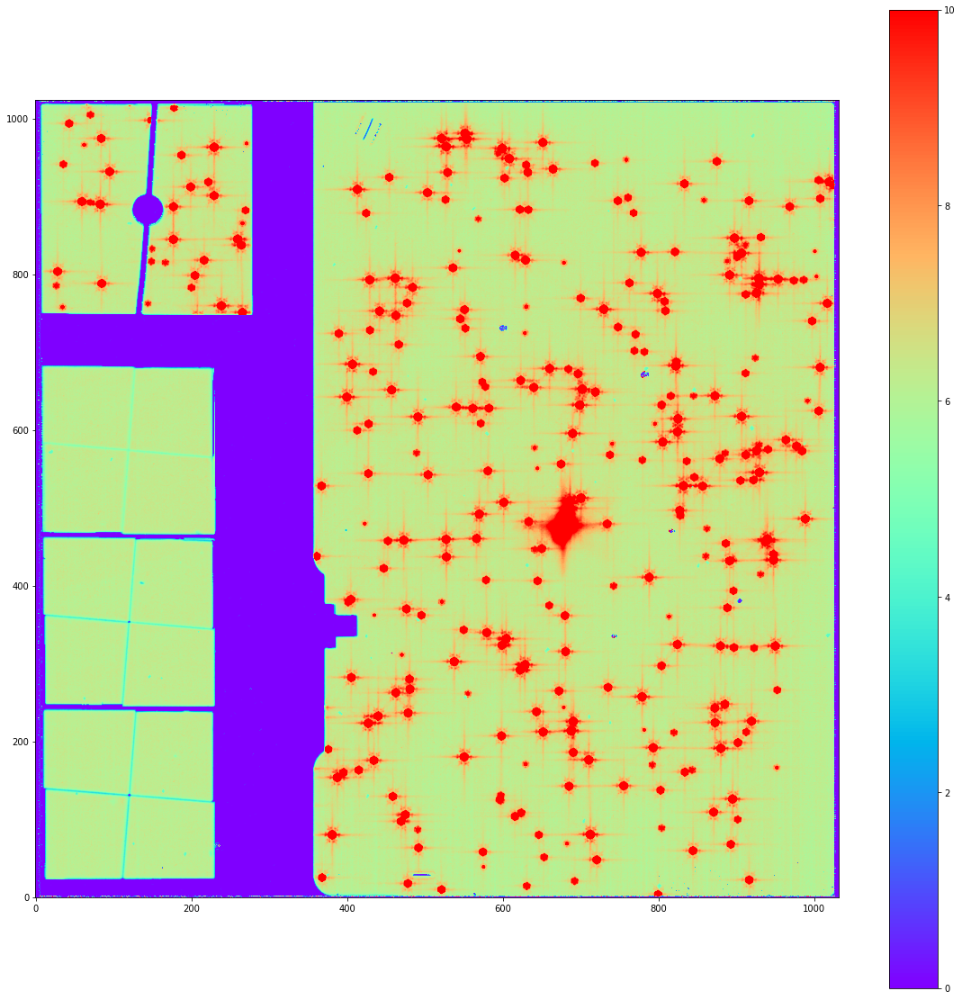

background region values 6.128729


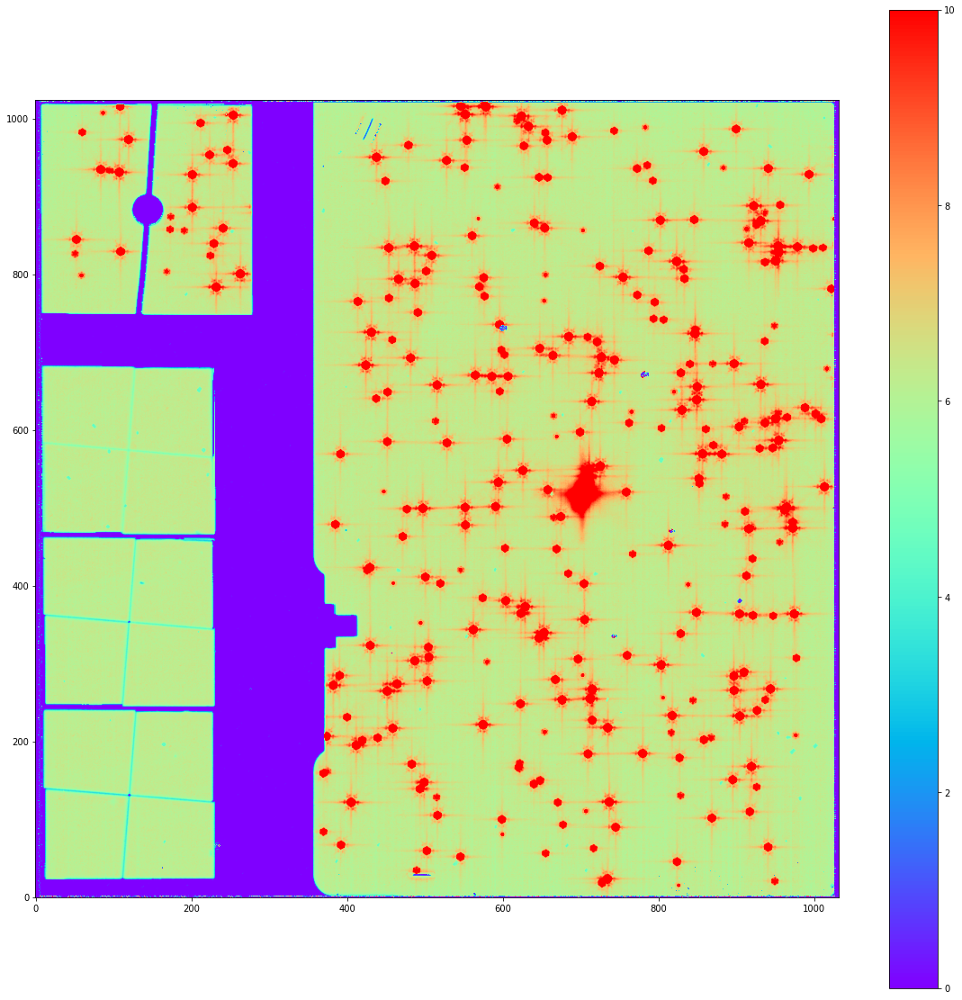

background region values 6.337776


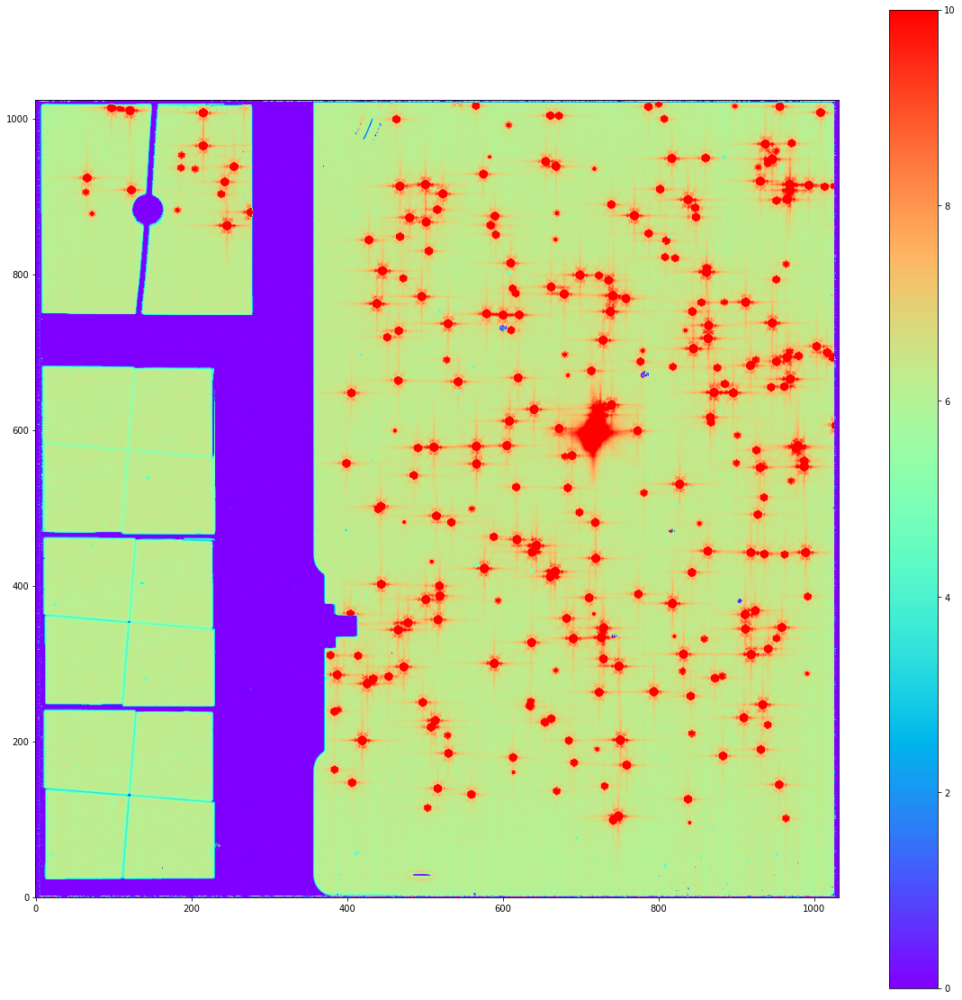

background region values 6.6935844


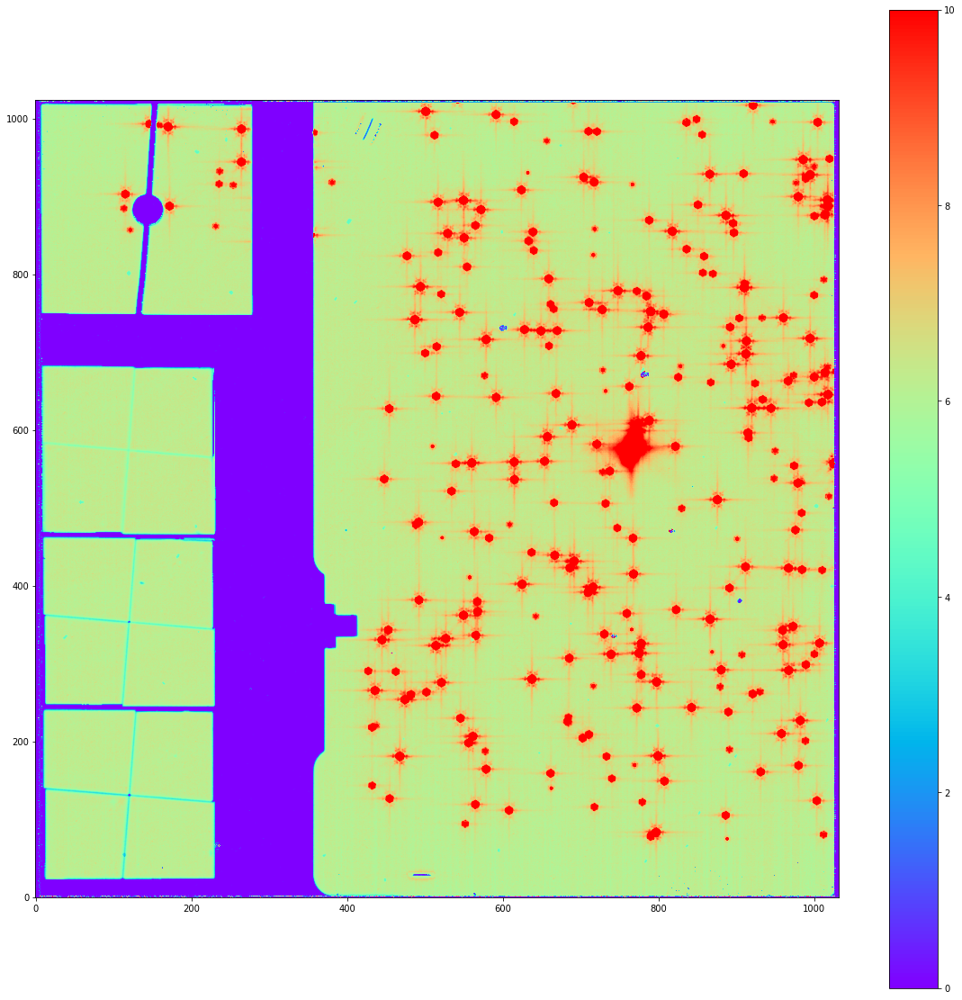

background region values 6.4585958


In [6]:
# Look at science images

for image in scislopelist:
    im = ImageModel(image)

    plt.figure(figsize=(20,20))
    plt.imshow(im.data, cmap='rainbow', origin='lower', vmin=0,vmax=10)
    plt.colorbar()
    plt.show()
    print('background region values', im.data[850, 500])

bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits


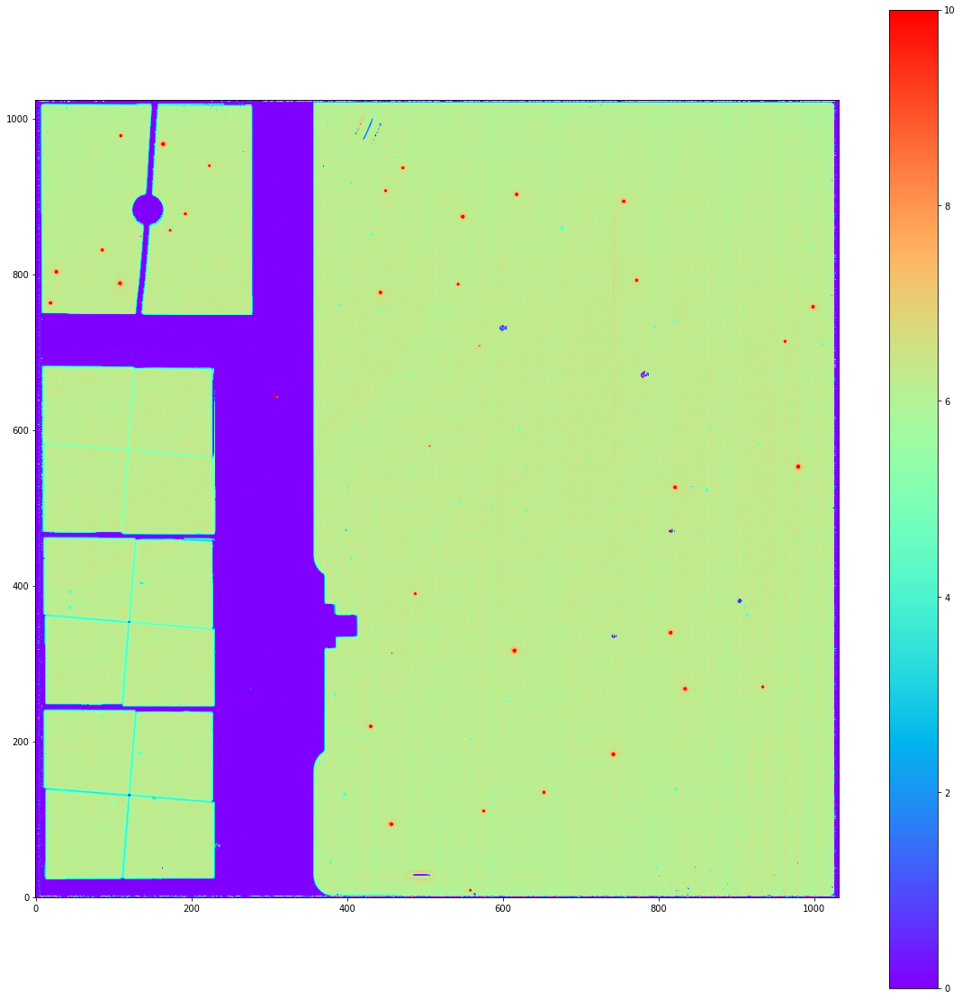

brightness of selected pixel 45.004734 

bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits


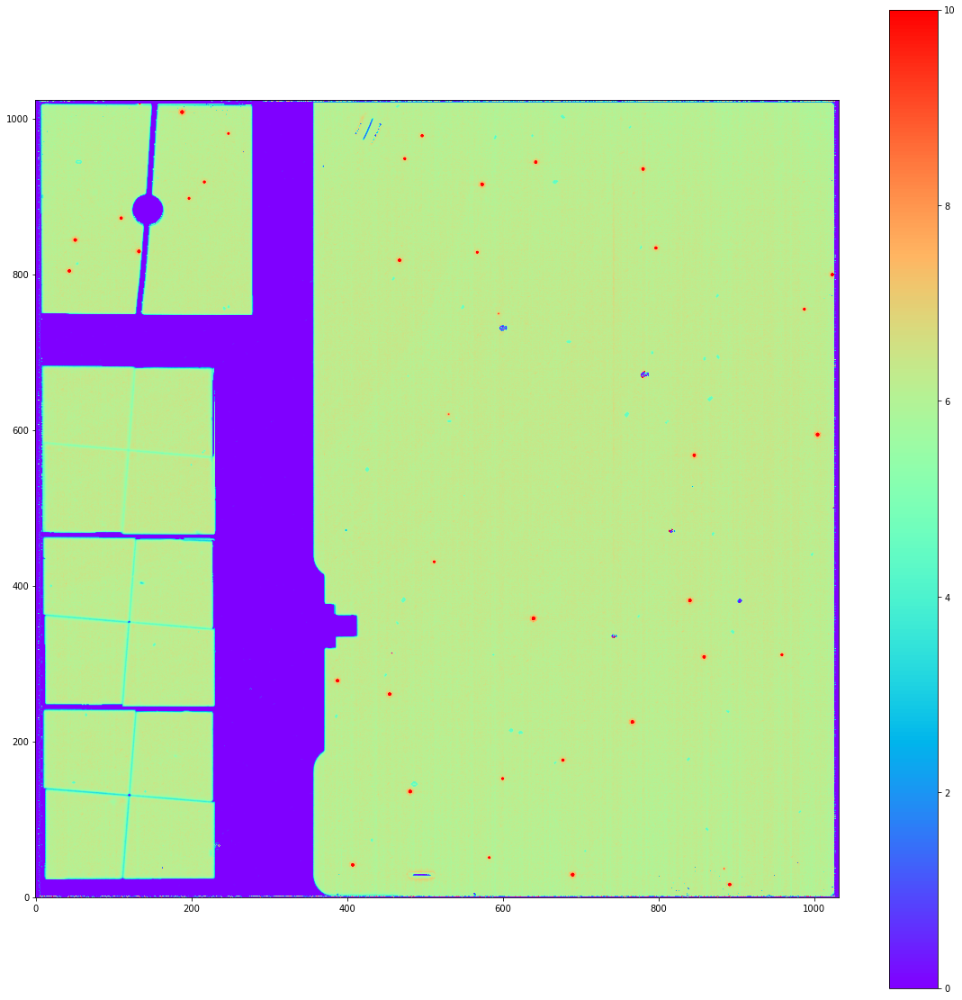

brightness of selected pixel 6.166749 

bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits


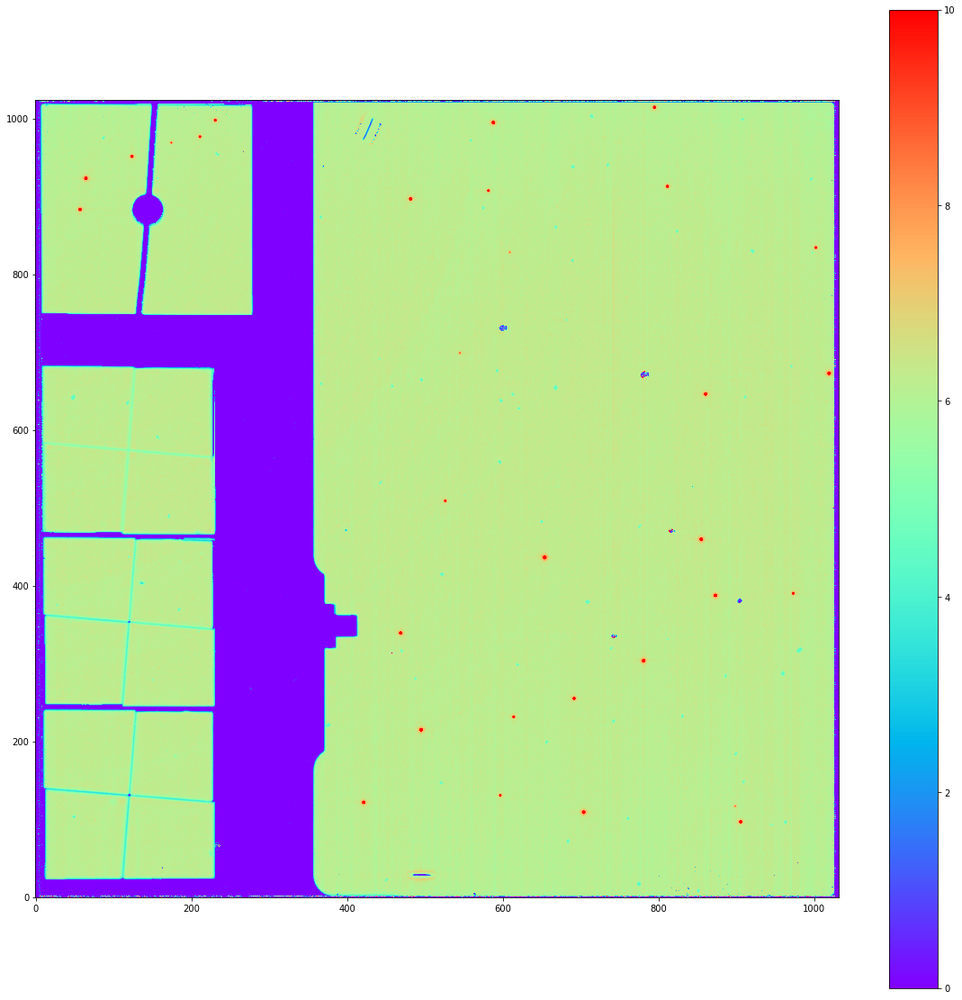

brightness of selected pixel 6.259433 

bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits


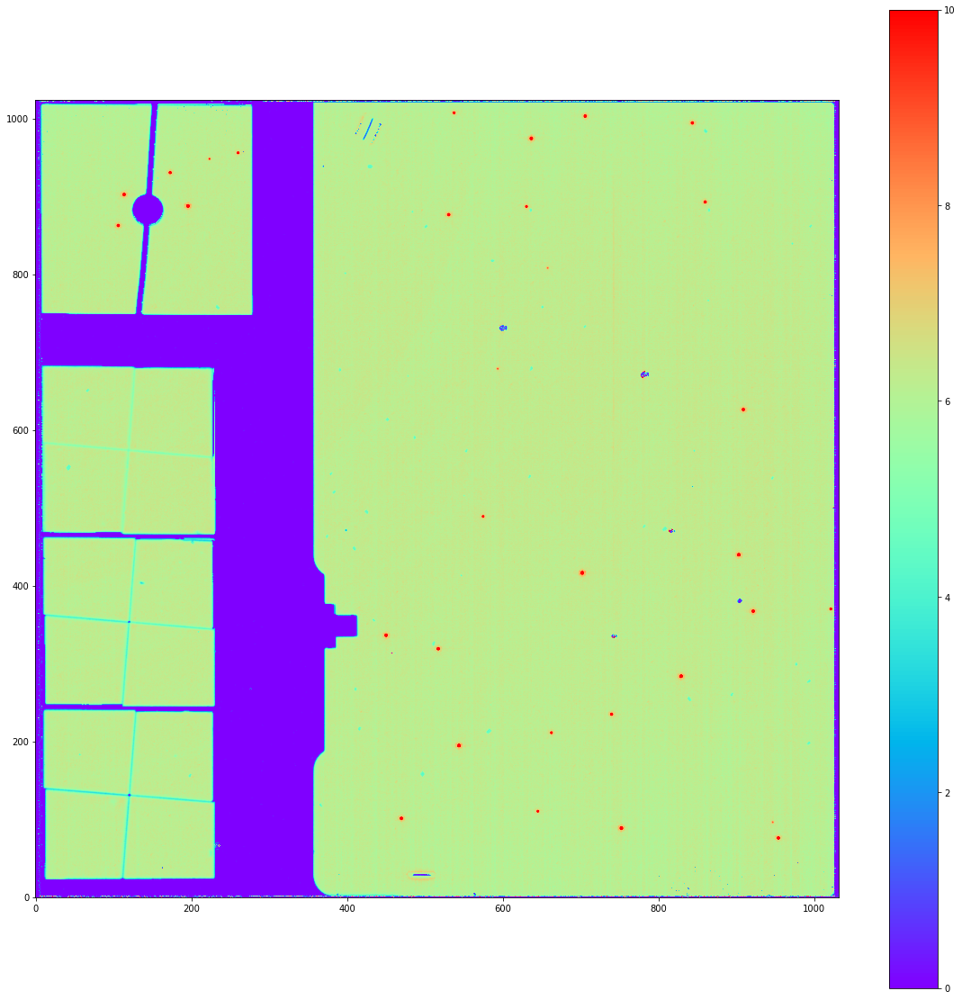

brightness of selected pixel 6.2830358 



In [7]:
# Look at background images
# Pixel to examine that should have a source in at least one background image
xval = 615
yval = 317

for backimage in bkgslopelist:
    bkgim = ImageModel(backimage)
    print(bkgim.meta.filename)
    selectedstar = bkgim.data[yval, xval] # Choose a pixel that is on a source in at least one image

    plt.figure(figsize=(20,20))
    plt.imshow(bkgim.data, cmap='rainbow', origin='lower', vmin=0,vmax=10)
    plt.colorbar()
    plt.show()

    print('brightness of selected pixel', selectedstar, '\n')

### Create a Level2 association file of the science and background exposures

In [8]:
# Create an association file of all of the rate files

asn_files = [scislopelist[0].meta.filename, scislopelist[1].meta.filename, scislopelist[2].meta.filename,
            scislopelist[3].meta.filename]
bgr_files = [bkgslopelist[0].meta.filename, bkgslopelist[1].meta.filename, bkgslopelist[2].meta.filename,
            bkgslopelist[3].meta.filename]

asn = asn_from_list.asn_from_list(asn_files, rule=DMSLevel2bBase, meta={'program':'test', 'target':'randomfield', 'asn_pool':'test'})

# now add the opposite nod as background exposure:
for product in asn['products']:
    product['members'].append({'expname':bgr_files[0], 'exptype':'background'})
    product['members'].append({'expname':bgr_files[1], 'exptype':'background'})
    product['members'].append({'expname':bgr_files[2], 'exptype':'background'})
    product['members'].append({'expname':bgr_files[3], 'exptype':'background'})
    
# write this out to a json file
with open('imager_bkgsubtest_asn.json', 'w') as fp:
    fp.write(asn.dump()[1])

## Run association file through background subtraction step of calwebb_image2

The default value of sigma for the background subtract step is set to 3, but may need to be adjusted downward to 2 or 1 in order to actually sigma clip the sources in the images. Test this for your data. For this particular data set, 2 is sufficient, but for brighter sources, 1 may be the best option.

In [9]:
pipe2 = Image2Pipeline()
# Set pipeline parameters
pipe2.save_results = True
pipe2.bkg_subtract.sigma = 2  # Set this in order to catch the outliers and leave only background
pipe2.bkg_subtract.maxiters = 3
pipe2.bkg_subtract.save_combined_background = True 

pipe2.assign_wcs.skip = True
pipe2.flat_field.skip = True
pipe2.photom.skip = True
pipe2.resample.skip = True
pipe2.save_bsub = True


pipe2.run('imager_bkgsubtest_asn.json')


2022-03-23 12:36:28,288 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2022-03-23 12:36:28,289 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2022-03-23 12:36:28,291 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2022-03-23 12:36:28,292 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2022-03-23 12:36:28,293 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2022-03-23 12:36:28,294 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2022-03-23 12:36:28,453 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('imager_bkgsubtest_asn.json',).


2022-03-23 12:36:28,457 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_bsub': True, 'steps': {'bkg_subtract': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': False, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_combined_background': True, 'sigma': 2, 'maxiters': 3}, 'assign_wcs': {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix

2022-03-23 12:36:28,509 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'starfield_med_seq1_MIRIMAGE_F770Wexp1_rate.fits' reftypes = ['wavelengthrange', 'wfssbkg']


2022-03-23 12:36:28,512 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2022-03-23 12:36:28,512 - stpipe.Image2Pipeline - INFO - Prefetch for WFSSBKG reference file is 'N/A'.


2022-03-23 12:36:28,513 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2022-03-23 12:36:28,519 - stpipe.Image2Pipeline - INFO - Processing product starfield_med_seq1_MIRIMAGE_F770Wexp1


2022-03-23 12:36:28,520 - stpipe.Image2Pipeline - INFO - Working on input starfield_med_seq1_MIRIMAGE_F770Wexp1_rate.fits ...


2022-03-23 12:36:28,659 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_rate.fits>, ['bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits']).


2022-03-23 12:36:28,661 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'bsub', 'search_output_file': True, 'input_dir': '', 'save_combined_background': True, 'sigma': 2, 'maxiters': 3}


2022-03-23 12:36:29,182 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq1_MIRIMAGE_F770Wexp1_combinedbackground.fits


2022-03-23 12:36:29,183 - stpipe.Image2Pipeline.bkg_subtract - INFO - Combined background written to "starfield_med_seq1_MIRIMAGE_F770Wexp1_combinedbackground.fits".


2022-03-23 12:36:29,246 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq1_MIRIMAGE_F770Wexp1_bsub.fits


2022-03-23 12:36:29,246 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2022-03-23 12:36:29,368 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:29,369 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-03-23 12:36:29,370 - stpipe.Image2Pipeline.assign_wcs - INFO - Step skipped.


2022-03-23 12:36:29,372 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-03-23 12:36:29,478 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:29,480 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-03-23 12:36:29,480 - stpipe.Image2Pipeline.flat_field - INFO - Step skipped.


2022-03-23 12:36:29,483 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-03-23 12:36:29,599 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:29,600 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': None, 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-03-23 12:36:29,601 - stpipe.Image2Pipeline.photom - INFO - Step skipped.


2022-03-23 12:36:29,603 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-03-23 12:36:29,711 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:29,712 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-03-23 12:36:29,713 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2022-03-23 12:36:29,715 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-03-23 12:36:29,715 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_med_seq1_MIRIMAGE_F770Wexp1


2022-03-23 12:36:29,717 - stpipe.Image2Pipeline - INFO - Processing product starfield_med_seq2_MIRIMAGE_F770Wexp1


2022-03-23 12:36:29,717 - stpipe.Image2Pipeline - INFO - Working on input starfield_med_seq2_MIRIMAGE_F770Wexp1_rate.fits ...


2022-03-23 12:36:29,860 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_rate.fits>, ['bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits']).


2022-03-23 12:36:29,862 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'bsub', 'search_output_file': True, 'input_dir': '', 'save_combined_background': True, 'sigma': 2, 'maxiters': 3}


2022-03-23 12:36:30,379 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq2_MIRIMAGE_F770Wexp1_combinedbackground.fits


2022-03-23 12:36:30,380 - stpipe.Image2Pipeline.bkg_subtract - INFO - Combined background written to "starfield_med_seq2_MIRIMAGE_F770Wexp1_combinedbackground.fits".


2022-03-23 12:36:30,442 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq2_MIRIMAGE_F770Wexp1_bsub.fits


2022-03-23 12:36:30,443 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2022-03-23 12:36:30,558 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:30,559 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'assign_wcs', 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-03-23 12:36:30,560 - stpipe.Image2Pipeline.assign_wcs - INFO - Step skipped.


2022-03-23 12:36:30,562 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-03-23 12:36:30,665 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:30,666 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'flat_field', 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-03-23 12:36:30,666 - stpipe.Image2Pipeline.flat_field - INFO - Step skipped.


2022-03-23 12:36:30,668 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-03-23 12:36:30,768 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:30,770 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'photom', 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-03-23 12:36:30,770 - stpipe.Image2Pipeline.photom - INFO - Step skipped.


2022-03-23 12:36:30,772 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-03-23 12:36:30,868 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:30,870 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-03-23 12:36:30,871 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2022-03-23 12:36:30,872 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-03-23 12:36:30,873 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_med_seq2_MIRIMAGE_F770Wexp1


2022-03-23 12:36:30,874 - stpipe.Image2Pipeline - INFO - Processing product starfield_med_seq3_MIRIMAGE_F770Wexp1


2022-03-23 12:36:30,875 - stpipe.Image2Pipeline - INFO - Working on input starfield_med_seq3_MIRIMAGE_F770Wexp1_rate.fits ...


2022-03-23 12:36:31,008 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_rate.fits>, ['bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits']).


2022-03-23 12:36:31,010 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'bsub', 'search_output_file': True, 'input_dir': '', 'save_combined_background': True, 'sigma': 2, 'maxiters': 3}


2022-03-23 12:36:31,522 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq3_MIRIMAGE_F770Wexp1_combinedbackground.fits


2022-03-23 12:36:31,523 - stpipe.Image2Pipeline.bkg_subtract - INFO - Combined background written to "starfield_med_seq3_MIRIMAGE_F770Wexp1_combinedbackground.fits".


2022-03-23 12:36:31,586 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq3_MIRIMAGE_F770Wexp1_bsub.fits


2022-03-23 12:36:31,586 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2022-03-23 12:36:31,703 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:31,704 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'assign_wcs', 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-03-23 12:36:31,705 - stpipe.Image2Pipeline.assign_wcs - INFO - Step skipped.


2022-03-23 12:36:31,706 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-03-23 12:36:31,808 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:31,810 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'flat_field', 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-03-23 12:36:31,810 - stpipe.Image2Pipeline.flat_field - INFO - Step skipped.


2022-03-23 12:36:31,812 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-03-23 12:36:31,910 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:31,911 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'photom', 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-03-23 12:36:31,912 - stpipe.Image2Pipeline.photom - INFO - Step skipped.


2022-03-23 12:36:31,913 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-03-23 12:36:32,011 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:32,012 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-03-23 12:36:32,013 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2022-03-23 12:36:32,014 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-03-23 12:36:32,015 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_med_seq3_MIRIMAGE_F770Wexp1


2022-03-23 12:36:32,016 - stpipe.Image2Pipeline - INFO - Processing product starfield_med_seq4_MIRIMAGE_F770Wexp1


2022-03-23 12:36:32,017 - stpipe.Image2Pipeline - INFO - Working on input starfield_med_seq4_MIRIMAGE_F770Wexp1_rate.fits ...


2022-03-23 12:36:32,157 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_rate.fits>, ['bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits', 'bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits']).


2022-03-23 12:36:32,159 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': False, 'suffix': 'bsub', 'search_output_file': True, 'input_dir': '', 'save_combined_background': True, 'sigma': 2, 'maxiters': 3}


2022-03-23 12:36:32,670 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq4_MIRIMAGE_F770Wexp1_combinedbackground.fits


2022-03-23 12:36:32,671 - stpipe.Image2Pipeline.bkg_subtract - INFO - Combined background written to "starfield_med_seq4_MIRIMAGE_F770Wexp1_combinedbackground.fits".


2022-03-23 12:36:32,734 - stpipe.Image2Pipeline.bkg_subtract - INFO - Saved model in starfield_med_seq4_MIRIMAGE_F770Wexp1_bsub.fits


2022-03-23 12:36:32,735 - stpipe.Image2Pipeline.bkg_subtract - INFO - Step bkg_subtract done


2022-03-23 12:36:32,852 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:32,854 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'assign_wcs', 'search_output_file': True, 'input_dir': '', 'sip_approx': True, 'sip_max_pix_error': 0.25, 'sip_degree': None, 'sip_max_inv_pix_error': 0.25, 'sip_inv_degree': None, 'sip_npoints': 32, 'slit_y_low': -0.55, 'slit_y_high': 0.55}


2022-03-23 12:36:32,854 - stpipe.Image2Pipeline.assign_wcs - INFO - Step skipped.


2022-03-23 12:36:32,856 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2022-03-23 12:36:32,966 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:32,967 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'flat_field', 'search_output_file': True, 'input_dir': '', 'save_interpolated_flat': False, 'user_supplied_flat': None, 'inverse': False}


2022-03-23 12:36:32,968 - stpipe.Image2Pipeline.flat_field - INFO - Step skipped.


2022-03-23 12:36:32,970 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2022-03-23 12:36:33,071 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:33,072 - stpipe.Image2Pipeline.photom - INFO - Step photom parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': False, 'skip': True, 'suffix': 'photom', 'search_output_file': True, 'input_dir': '', 'inverse': False, 'source_type': None}


2022-03-23 12:36:33,073 - stpipe.Image2Pipeline.photom - INFO - Step skipped.


2022-03-23 12:36:33,075 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2022-03-23 12:36:33,177 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_bsub.fits>,).


2022-03-23 12:36:33,179 - stpipe.Image2Pipeline.resample - INFO - Step resample parameters are: {'pre_hooks': [], 'post_hooks': [], 'output_file': None, 'output_dir': None, 'output_ext': '.fits', 'output_use_model': False, 'output_use_index': True, 'save_results': True, 'skip': True, 'suffix': 'i2d', 'search_output_file': True, 'input_dir': '', 'pixfrac': 1.0, 'kernel': 'square', 'fillval': 'INDEF', 'weight_type': 'ivm', 'output_shape': None, 'crpix': None, 'crval': None, 'rotation': None, 'pixel_scale_ratio': 1.0, 'pixel_scale': None, 'single': False, 'blendheaders': True, 'allowed_memory': None}


2022-03-23 12:36:33,179 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2022-03-23 12:36:33,181 - stpipe.Image2Pipeline.resample - INFO - Step resample done


2022-03-23 12:36:33,181 - stpipe.Image2Pipeline - INFO - Finished processing product starfield_med_seq4_MIRIMAGE_F770Wexp1


2022-03-23 12:36:33,183 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2022-03-23 12:36:33,251 - stpipe.Image2Pipeline - INFO - Saved model in starfield_med_seq1_MIRIMAGE_F770Wexp1_cal.fits


2022-03-23 12:36:33,314 - stpipe.Image2Pipeline - INFO - Saved model in starfield_med_seq2_MIRIMAGE_F770Wexp1_cal.fits


2022-03-23 12:36:33,375 - stpipe.Image2Pipeline - INFO - Saved model in starfield_med_seq3_MIRIMAGE_F770Wexp1_cal.fits


2022-03-23 12:36:33,437 - stpipe.Image2Pipeline - INFO - Saved model in starfield_med_seq4_MIRIMAGE_F770Wexp1_cal.fits


2022-03-23 12:36:33,438 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


[<ImageModel(1024, 1032) from starfield_med_seq1_MIRIMAGE_F770Wexp1_cal.fits>,
 <ImageModel(1024, 1032) from starfield_med_seq2_MIRIMAGE_F770Wexp1_cal.fits>,
 <ImageModel(1024, 1032) from starfield_med_seq3_MIRIMAGE_F770Wexp1_cal.fits>,
 <ImageModel(1024, 1032) from starfield_med_seq4_MIRIMAGE_F770Wexp1_cal.fits>]

### Look at averaged background image

See how well the sigma clipping did at removing the sources from the background image. If the sources in the background image are bright, the value of sigma should be set to 1. If the sources are faint enough, the default value of 3 should be good enough. 

Also look at the value of a specific pixel in the averaged image, one that has a source in at least one of the background images, to see if the flux was adequately removed in the sigma clipping process.

['starfield_med_seq1_MIRIMAGE_F770Wexp1_combinedbackground.fits', 'starfield_med_seq2_MIRIMAGE_F770Wexp1_combinedbackground.fits', 'starfield_med_seq3_MIRIMAGE_F770Wexp1_combinedbackground.fits', 'starfield_med_seq4_MIRIMAGE_F770Wexp1_combinedbackground.fits']


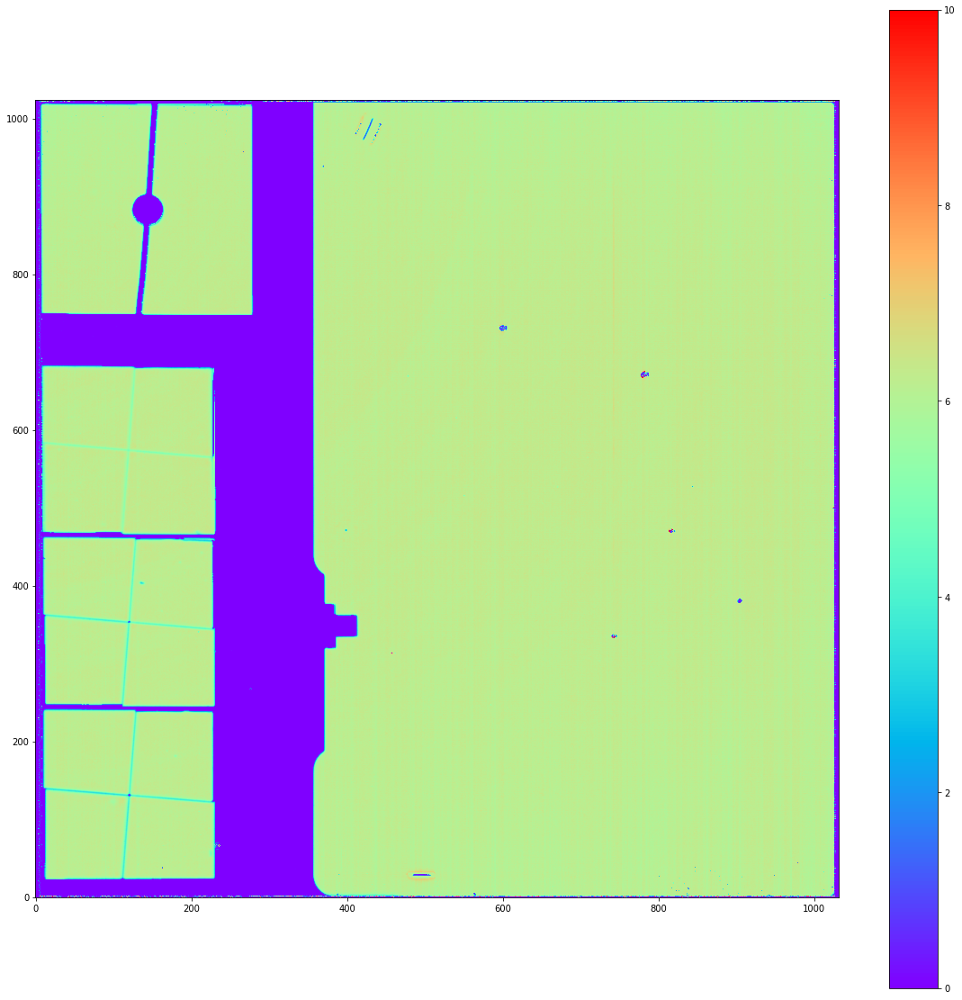

brightness of selected pixel 6.236406


In [10]:
# This can only be uncommented in builds after 7.7.1
averaged_backgrounds = glob.glob('*combinedbackground.fits')
print(averaged_backgrounds)

avgbkg = ImageModel(averaged_backgrounds[0])
selectedavgstar = avgbkg.data[yval, xval]  # Choose a pixel location that contains a source in at least one background image

plt.figure(figsize=(20,20))
plt.imshow(avgbkg.data, cmap='rainbow', origin='lower', vmin=0,vmax=10)
plt.colorbar()
plt.show()

print('brightness of selected pixel', selectedavgstar)

Look at the values of pixels in the background images at the location of one of the stars to see whether the star flux is being rejected as part of the sigma clipping. In calwebb_image2, the sigma value was set to 2, which is lower than the default value of 3. This allows the most pixels to be rejected as outliers, and should leave only the background values in the final averaged image.

In [11]:
### Check averaging of background images

print(bkgslopelist,'\n')
im1 = ImageModel(bkgslopelist[0])
im2 = ImageModel(bkgslopelist[1])
im3 = ImageModel(bkgslopelist[2])
im4 = ImageModel(bkgslopelist[3])

print('Value in image1 ', im1.data[yval, xval])
print('Value in image2 ', im2.data[yval, xval])
print('Value in image3 ', im3.data[yval, xval])
print('Value in image4 ', im4.data[yval, xval],'\n')

avgvalue = (im1.data[yval, xval]+ im2.data[yval, xval] + im3.data[yval, xval] + im4.data[yval, xval])/4
print('Averaged value = ', avgvalue)
print()

print('Brightness of selected pixel in averaged image', selectedavgstar)

[<ImageModel(1024, 1032) from bkg_faint_seq1_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq2_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq3_MIRIMAGE_F770Wexp1_rate.fits>, <ImageModel(1024, 1032) from bkg_faint_seq4_MIRIMAGE_F770Wexp1_rate.fits>] 

Value in image1  45.004734
Value in image2  6.166749
Value in image3  6.259433
Value in image4  6.2830358 

Averaged value =  15.928487777709961

Brightness of selected pixel in averaged image 6.236406


### Look at background subtracted data


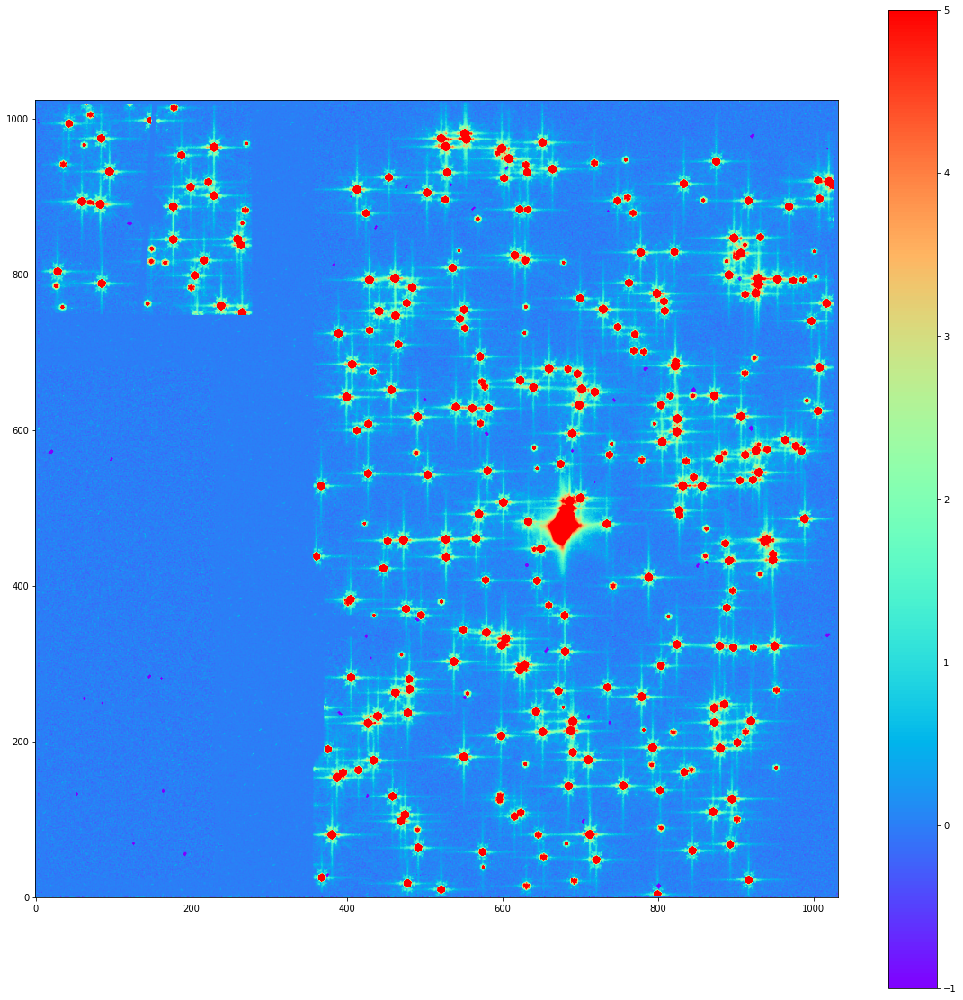

background region values 0.018823147
Background subtraction test PASSED: background is near zero


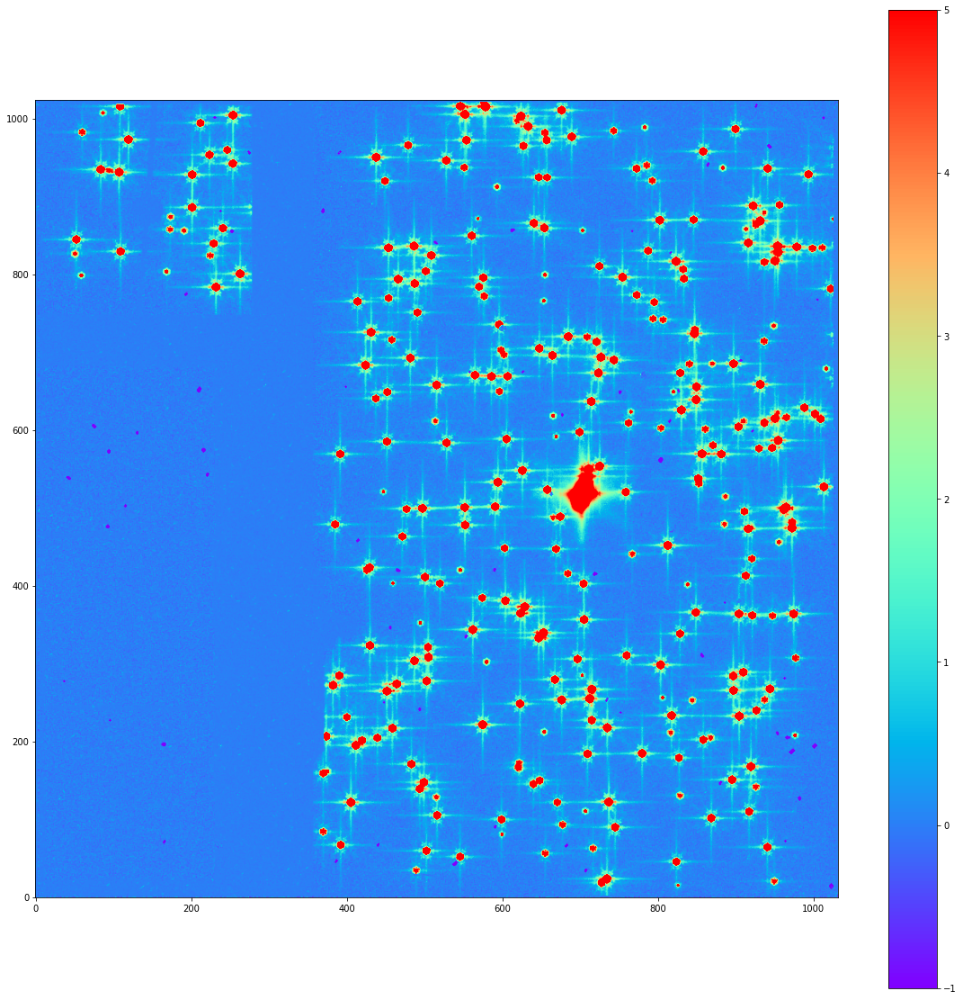

background region values 0.22787046
Background subtraction test PASSED: background is near zero


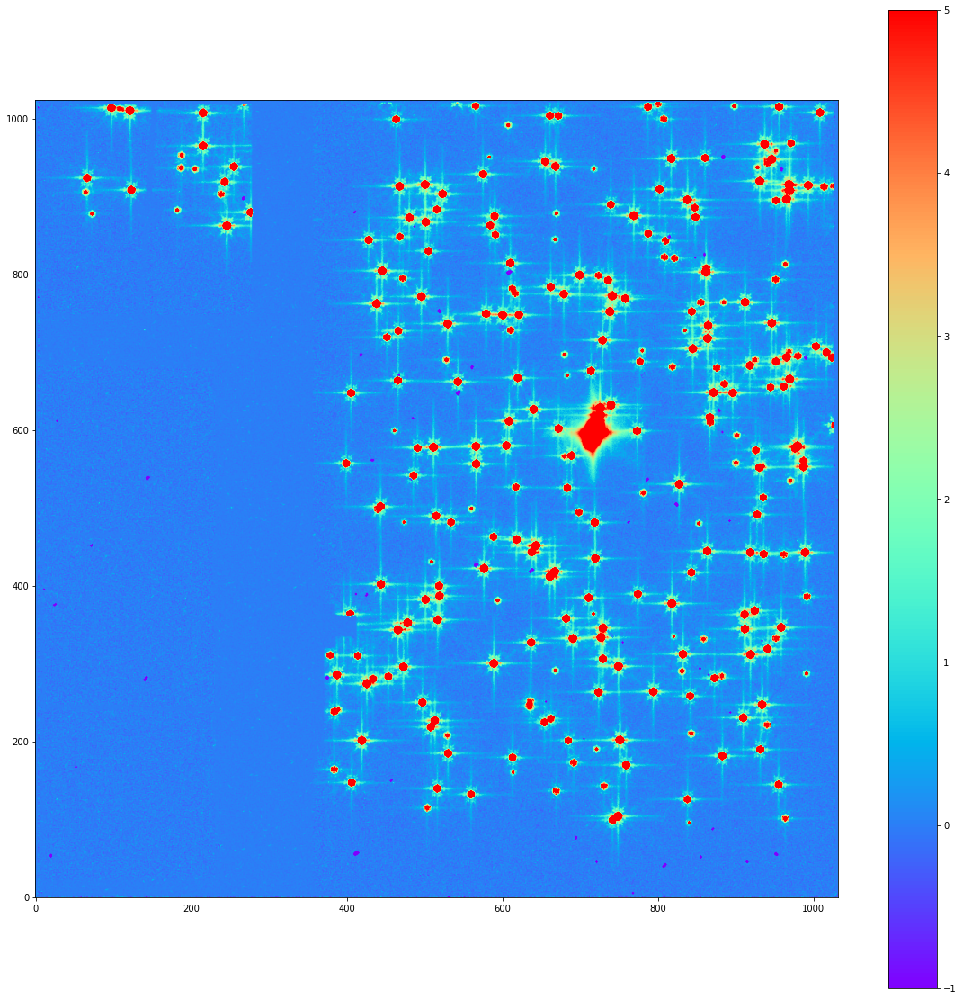

background region values 0.5836787
Background subtraction test PASSED: background is near zero


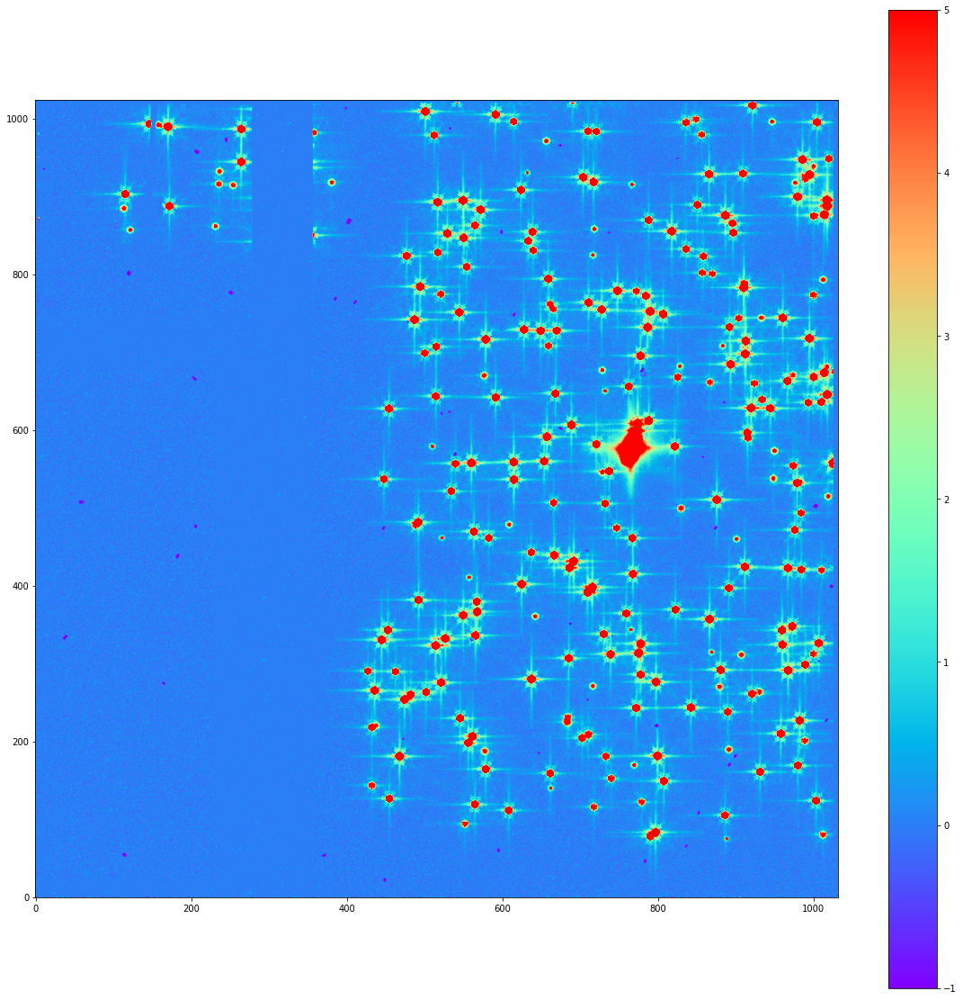

background region values 0.34869003
Background subtraction test PASSED: background is near zero


In [12]:
# Look at background image
subtracted_images = glob.glob('*bsub.fits')

for bkgsubimage in subtracted_images:
    bkgsub = ImageModel(bkgsubimage)

    plt.figure(figsize=(20,20))
    plt.imshow(bkgsub.data, cmap='rainbow', origin='lower', vmin=-1,vmax=5)
    plt.colorbar()
    plt.show()
    print('background region values', bkgsub.data[850, 500])
    try:
        np.testing.assert_allclose(bkgsub.data[850, 500], 0.01, atol=0.8)
        print('Background subtraction test PASSED: background is near zero')
    except AssertionError as e:
        print('Test FAILED: Subtracted background value is not near zero')

<a id="testing"></a>
# Passing criteria

Examine the images shown and the pixel values reported through the notebook. If the averaged background image is subtracted from the science images (subtracted background values near 0), and the averaged background image shows a smooth background with the sources removed, then this test passes. The four background images should be averaged together after the sources were rejected via sigma clipping. Check that the subtracted background values are near 0.

[Top of Page](#title_ID)

<a id="about_ID"></a>
## About this Notebook
**Author:** M Cracraft, Senior Staff Scientist, INS/MIRI branch
<br>**Updated On:** 06/09/2021

[Top of Page](#title_ID)
<img style="float: right;" src="./stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="stsci_pri_combo_mark_horizonal_white_bkgd" width="200px"/> 